In [1]:
import ReviewData as RD

In [2]:
bikeways = RD.readBikeFacility(add=False)

In [3]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import seaborn as sns
import os

In [4]:
MPObd = gpd.read_file("V:/Data/Transportation/MPO_Bound.shp")

In [5]:
bikeways_cl = gpd.clip(bikeways, MPObd)

In [6]:
bikeways_cl.head()

,name,type,lane_type,source,geom
12,None,Bike Route,None,EUG,"LINESTRING (-13702263.711 5466263.878, -137022..."
9,0,Pedestrian and Bicycle Access Way,None,EUG,"LINESTRING (-13702576.270 5465896.860, -137025..."
10,0,Pedestrian and Bicycle Access Way,None,EUG,"LINESTRING (-13702498.076 5465965.954, -137024..."
14,None,Bike Route,None,LCOG,"LINESTRING (-13702689.071 5466338.715, -137025..."
2561,None,Bike Route,None,LCOG,"LINESTRING (-13702704.136 5466341.922, -137026..."


In [7]:
bph = gpd.read_file("T:/DCProjects/StoryMap/BikeCounting/BikeCounts/Output/BPH.shp")

In [8]:
bph = bph.to_crs(epsg=3857)

In [9]:
bph.shape

(177, 11)

In [10]:
gpd.options.use_pygeos = True

In [11]:
spatial_join = gpd.sjoin_nearest(bph, bikeways_cl, distance_col="distances")

In [12]:
spatial_join.distances.describe()

count     178.000000
mean       96.614358
std       494.205749
min         0.075835
25%         0.915818
50%         1.744558
75%         6.951639
max      3899.685572
Name: distances, dtype: float64

In [13]:
spatial_join.shape

(178, 17)

In [14]:
spatial_join.head()

,Location,BPH,Latitude,Longitude,Site_Name,DoubleCNT,IsOneway,OnewayDIR,IsSidewalk,Years,geometry,index_right,name,type,lane_type,source,distances
0,10thWestJackson,6.067299,44.048822,-123.108137,10th Ave West of Jackson St,0,0,<Null>,0,4,POINT (-13704335.123 5473000.611),514,None,Neighborhood Greenway,None,EUG,172.003997
42,8thWestAdams,6.478683,44.050901,-123.106598,8th Ave Street West of Adams St,0,0,<Null>,0,5,POINT (-13704163.803 5473322.612),514,None,Neighborhood Greenway,None,EUG,149.908818
1,11thWestAlder,16.201482,44.047713,-123.080893,11th Ave West of Alder St,1,0,<Null>,0,4,POINT (-13701302.335 5472828.851),424,None,Bike Lane,None,LCOG,9.203193
2,11thWestAlderSouthSidewalk,2.208680,44.047713,-123.080716,11th Ave South Sidewalk West of Alder St,0,0,<Null>,1,3,POINT (-13701282.632 5472828.851),424,None,Bike Lane,None,LCOG,9.254136
3,12thAvePathEastWillamette,10.154583,44.046569,-123.092231,12th Ave Path East of Willamette St,0,0,<Null>,0,8,POINT (-13702564.476 5472651.674),383,0,Pedestrian and Bicycle Access Way,None,EUG,0.886903


In [15]:
spatial_join.crs.axis_info[0].unit_name

'metre'

In [16]:
spatial_join.lane_type.unique()

array([None, 'Protected Bikeway', 'Buffered Bike Lane',
       'Shared Lane Marking'], dtype=object)

In [17]:
spatial_join[~spatial_join.lane_type.isna()].head()

,Location,BPH,Latitude,Longitude,Site_Name,DoubleCNT,IsOneway,OnewayDIR,IsSidewalk,Years,geometry,index_right,name,type,lane_type,source,distances
10,13thEastLincoln,10.809524,44.045513,-123.097519,13th Ave East of Lincoln St,0,1,East,0,1,POINT (-13703153.133 5472488.128),2896,None,Bike Lane,Protected Bikeway,EUG,5.804248
11,13thEastPatterson,19.661998,44.045512,-123.083145,13th Ave East of Patterson St,0,1,East,0,4,POINT (-13701553.027 5472487.974),2888,None,Bike Lane,Protected Bikeway,EUG,9.138663
12,13thEastPattersonNorthSidewalk,6.855049,44.045512,-123.082745,13th Ave North Sidewalk East of Patterson St,0,0,<Null>,1,4,POINT (-13701508.499 5472487.974),2888,None,Bike Lane,Protected Bikeway,EUG,9.154670
13,13thEastPattersonSouthSidewalk,1.394949,44.045512,-123.083072,13th Ave South Sidewalk East of Patterson St,0,0,<Null>,1,2,POINT (-13701544.900 5472487.974),2888,None,Bike Lane,Protected Bikeway,EUG,9.141585
14,13thEastTaylor,2.704143,44.045530,-123.113670,13th Ave East of Taylor St,0,1,East,0,3,POINT (-13704951.054 5472490.761),2889,None,Bike Lane,Buffered Bike Lane,EUG,5.808676


In [18]:
spatial_join_n = spatial_join[spatial_join.distances <= 10]

In [19]:
outpath = r"T:\DCProjects\StoryMap\BikeCounting\figures"

In [20]:
def standardization(x):
    z = (x - min(x))/(max(x) - min(x))
    return(z)

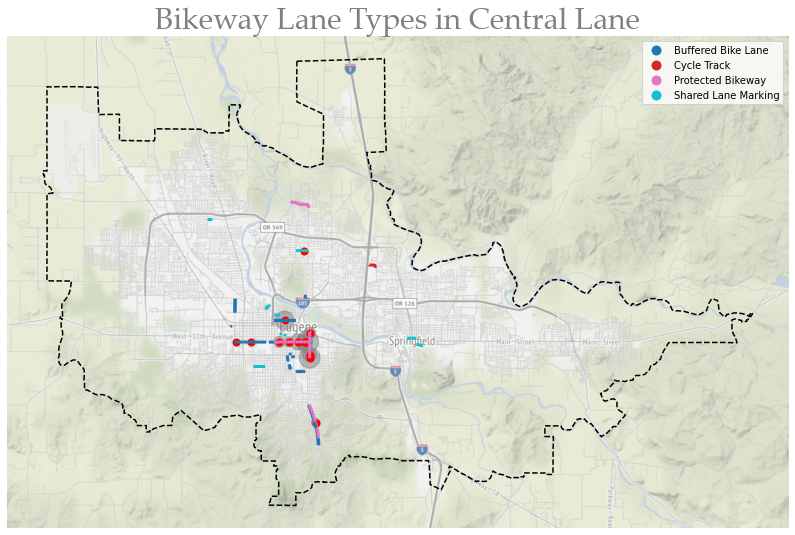

In [21]:
fig, ax = plt.subplots(figsize=(14, 12))
bikeways_cl.plot(ax=ax, column='lane_type', cmap='tab10', legend=True, linewidth = 3, aspect=1)
MPObd.plot(ax=ax, facecolor="none", edgecolor="black", linestyle='--', linewidth = 1.5, aspect=1)
bphdata = spatial_join_n[~spatial_join_n.lane_type.isna()]
values = standardization(bphdata['BPH'].astype(int)) * 500
bphdata.plot(ax=ax, marker='o', markersize=values, color='grey', alpha=.5, legend=False, aspect=1)
bphdata.plot(ax=ax, marker='o', markersize=50, color='red', aspect=1)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, attribution=False)
ctx.add_basemap(ax, alpha = 0.6, attribution=False)
ax.ticklabel_format(style='sci')
plt.title("Bikeway Lane Types in Central Lane", fontsize=30, fontname="Palatino Linotype", 
          color="grey")
ax.axis("off");
plt.savefig(os.path.join(outpath, "bikeway_lane_types.png"), transparent=True, bbox_inches='tight');

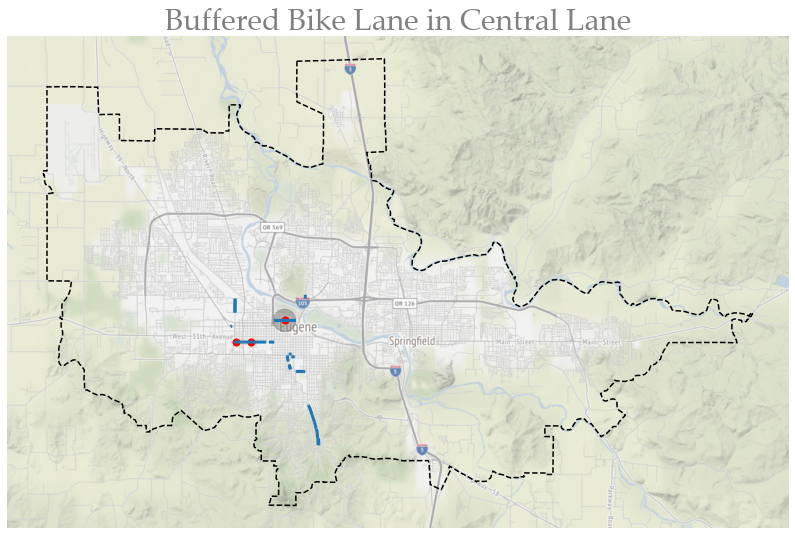

In [22]:
fig, ax = plt.subplots(figsize=(14, 12))
bikeways_cl[bikeways_cl.lane_type=='Buffered Bike Lane'].plot(ax=ax, color='#1f77b4', linewidth = 3, aspect=1)
MPObd.plot(ax=ax, facecolor="none", edgecolor="black", linestyle='--', linewidth = 1.5, aspect=1)
bphdata_buffered = bphdata[bphdata.lane_type=='Buffered Bike Lane']
values = standardization(bphdata_buffered['BPH'].astype(int)) * 500
bphdata_buffered.plot(ax=ax, marker='o', markersize=values, color='grey', alpha=.5, legend=False, aspect=1)
bphdata_buffered.plot(ax=ax, marker='o', markersize=50, color='red', aspect=1)
ctx.add_basemap(ax, alpha = 0.6, attribution=False)
ax.ticklabel_format(style='sci')
plt.title("Buffered Bike Lane in Central Lane", fontsize=30, fontname="Palatino Linotype", 
          color="grey")
ax.axis("off");
plt.savefig(os.path.join(outpath, "Buffered_Bike_Lane.png"), transparent=True, bbox_inches='tight');

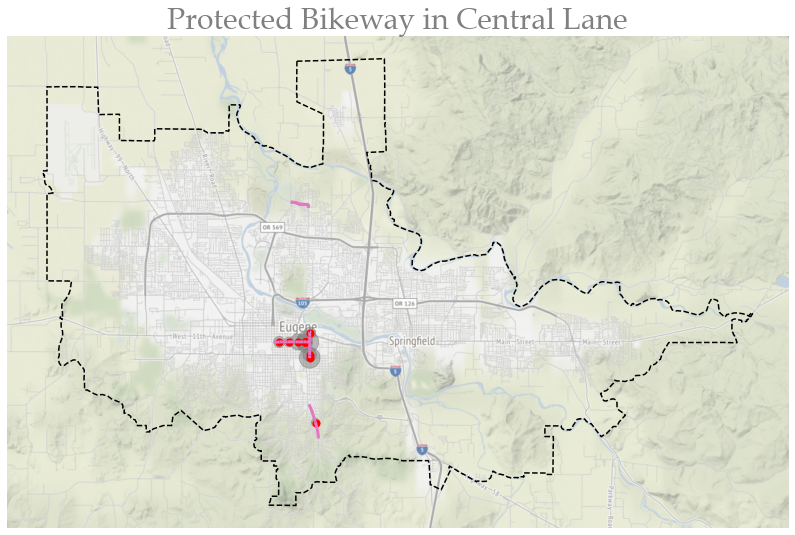

In [23]:
fig, ax = plt.subplots(figsize=(14, 12))
bikeways_cl[bikeways_cl.lane_type=='Protected Bikeway'].plot(ax=ax, color='#e377c2', linewidth = 3, aspect=1)
MPObd.plot(ax=ax, facecolor="none", edgecolor="black", linestyle='--', linewidth = 1.5, aspect=1)
bphdata_protected = bphdata[bphdata.lane_type=='Protected Bikeway']
values = standardization(bphdata_protected['BPH'].astype(int)) * 500
bphdata_protected.plot(ax=ax, marker='o', markersize=values, color='grey', alpha=.5, legend=False, aspect=1)
bphdata_protected.plot(ax=ax, marker='o', markersize=50, color='red', aspect=1)
ctx.add_basemap(ax, alpha = 0.6, attribution=False)
ax.ticklabel_format(style='sci')
plt.title("Protected Bikeway in Central Lane", fontsize=30, fontname="Palatino Linotype", 
          color="grey")
ax.axis("off")
plt.savefig(os.path.join(outpath, "Protected_Bikeway.png"), transparent=True, bbox_inches='tight');

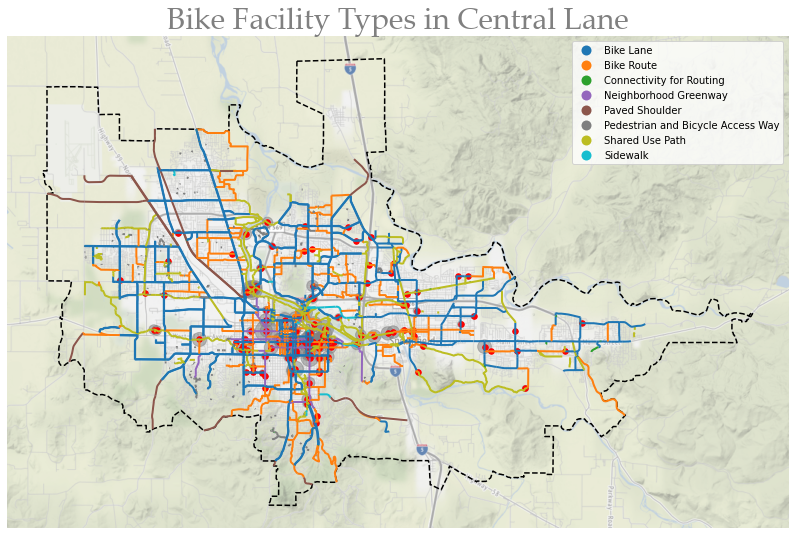

In [24]:
fig, ax = plt.subplots(figsize=(14, 12))
bikeways_cl.plot(ax=ax, column='type', cmap="tab10", legend=True, linewidth = 2, aspect=1)
MPObd.plot(ax=ax, facecolor="none", edgecolor="black", linestyle='--', linewidth = 1.5, aspect=1)
values = standardization(spatial_join_n['BPH'].astype(int)) * 500
spatial_join_n.plot(ax=ax, marker='o', markersize=values, color='grey', alpha=.5, legend=False, aspect=1)
spatial_join_n.plot(ax=ax, marker='o', markersize=30, color='red', aspect=1)
ctx.add_basemap(ax, alpha = 0.6, attribution=False)
ax.ticklabel_format(style='sci')
plt.title("Bike Facility Types in Central Lane", fontsize=30, fontname="Palatino Linotype", 
          color="grey")
ax.axis("off")
plt.savefig(os.path.join(outpath, "bikeway_types.png"), transparent=True, bbox_inches='tight');

In [25]:
palette = sns.color_palette("tab10", 8).as_hex()
print(palette)

['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']


In [26]:
from pylab import *

In [27]:
cmap=cm.get_cmap('tab10', 8)

In [28]:
rgba = cmap(1)
matplotlib.colors.rgb2hex(rgba)

'#ff7f0e'

In [29]:
ftypes = sorted(bikeways_cl['type'].unique())

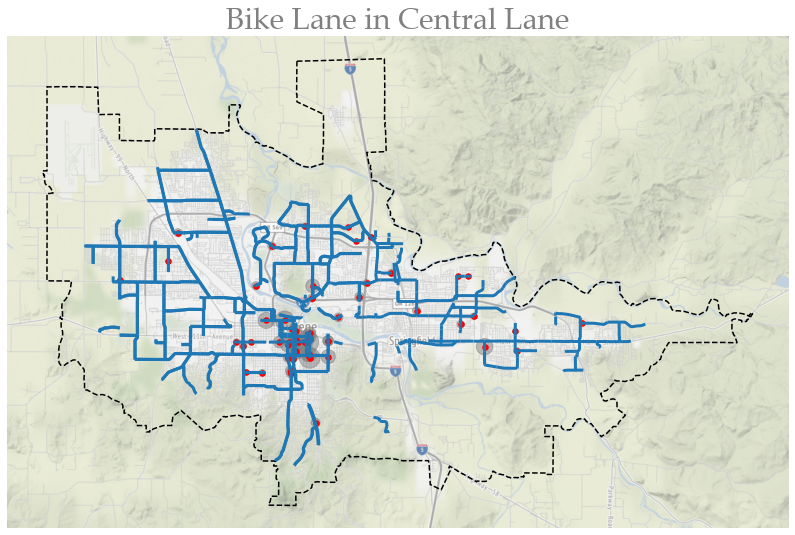

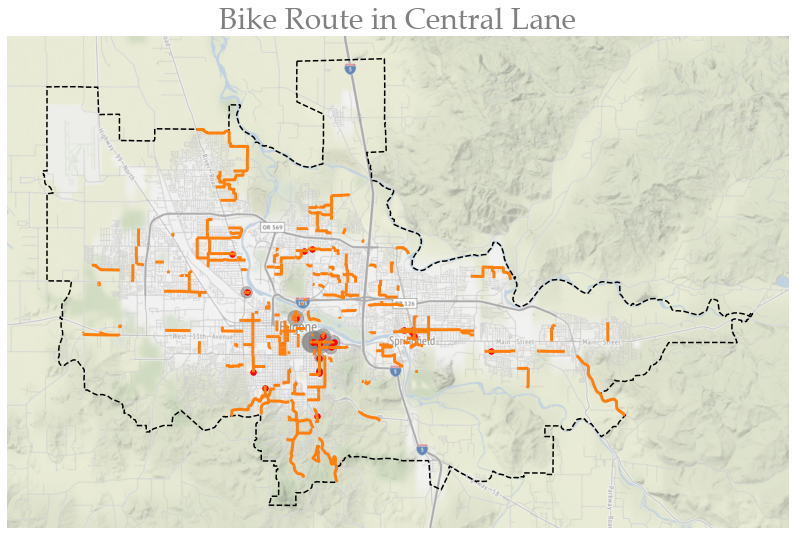

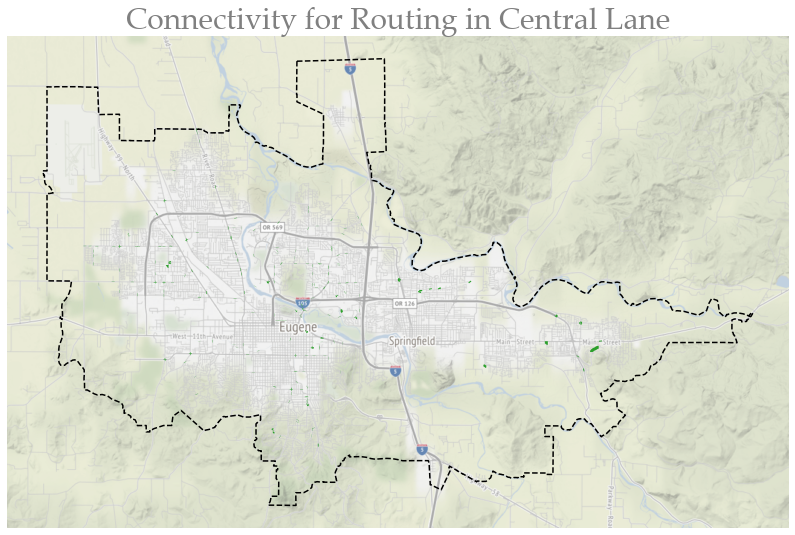

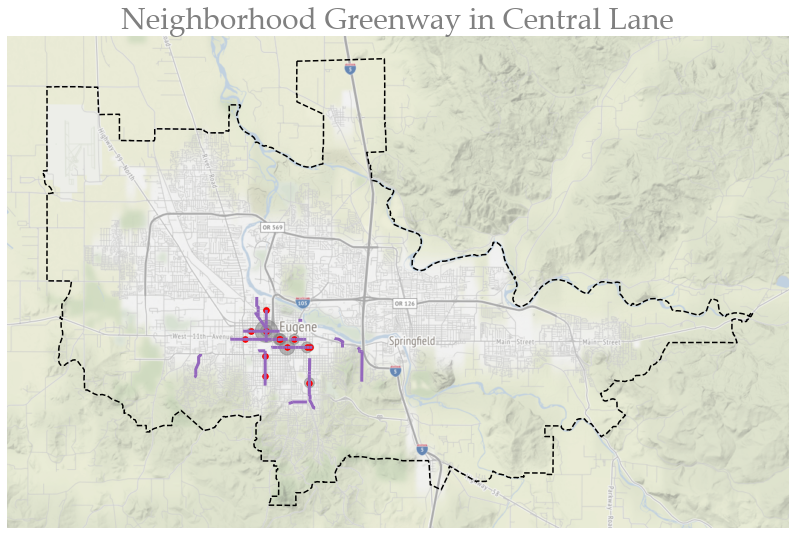

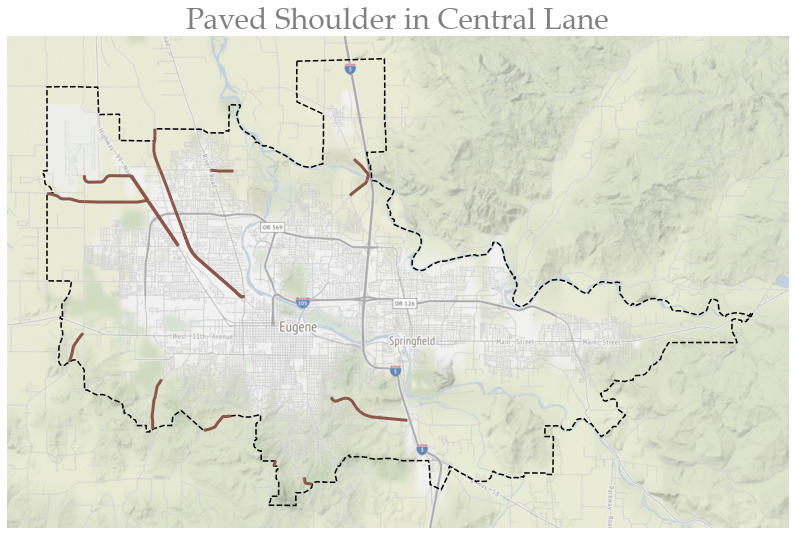

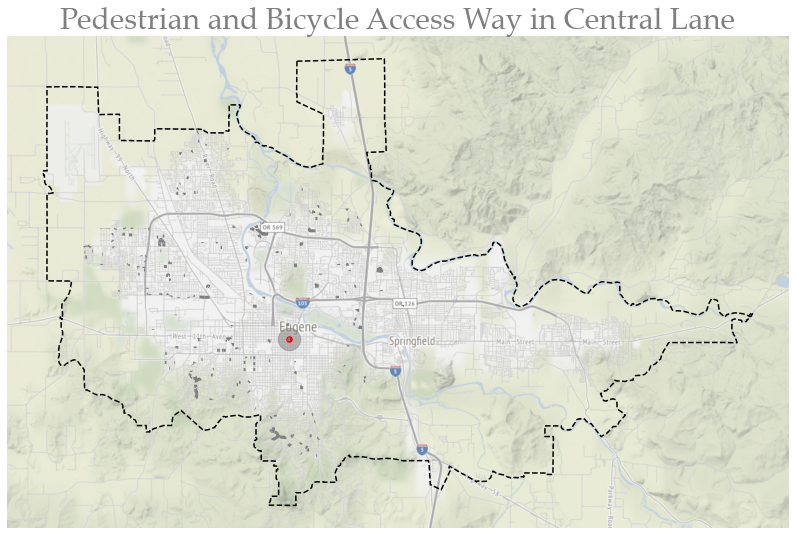

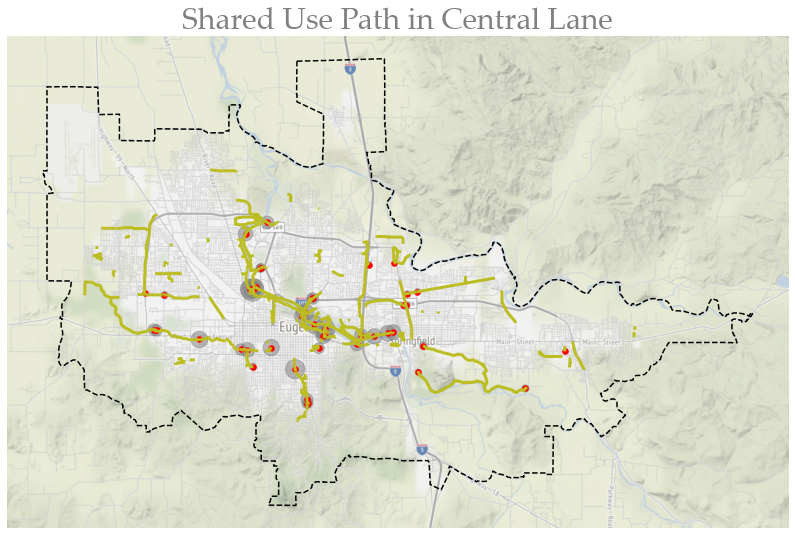

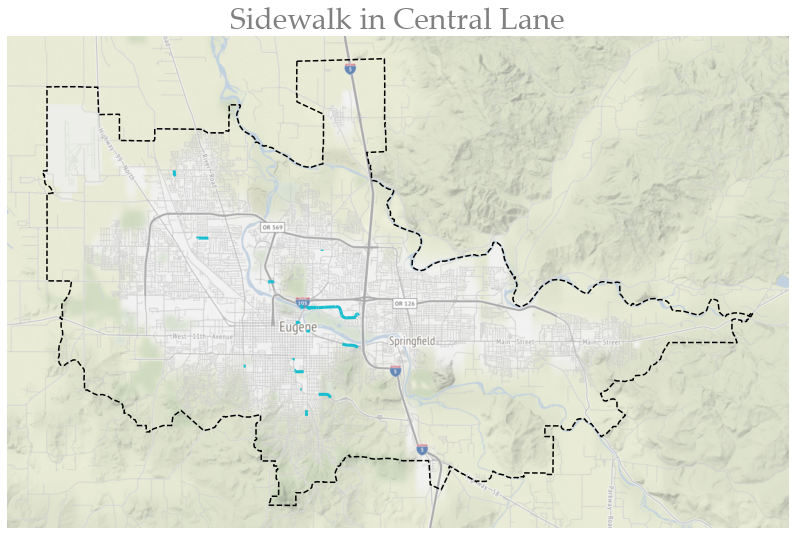

In [30]:
for i in range(0, 8):
    fig, ax = plt.subplots(figsize=(14, 12))
    rgba = cmap(i)
    bikeways_cl[bikeways_cl['type']==ftypes[i]].plot(ax=ax, color=matplotlib.colors.rgb2hex(rgba), linewidth = 3, aspect=1)
    MPObd.plot(ax=ax, facecolor="none", edgecolor="black", linestyle='--', linewidth = 1.5, aspect=1)
    if ftypes[i] in list(spatial_join_n['type'].unique()):
        spatial_join_s = spatial_join_n[spatial_join_n['type']==ftypes[i]]
        if spatial_join_s.shape[0] == 1:
            values = 500
        else:
            values = standardization(spatial_join_s['BPH'].astype(int)) * 500
        spatial_join_s.plot(ax=ax, marker='o', markersize=values, color='grey', alpha=.5, legend=False, aspect=1)
        spatial_join_s.plot(ax=ax, marker='o', markersize=30, color='red', aspect=1)
    ctx.add_basemap(ax, alpha = 0.6, attribution=False)
    ax.ticklabel_format(style='sci')
    plt.title("{0} in Central Lane".format(ftypes[i]), fontsize=30, fontname="Palatino Linotype", 
              color="grey")
    ax.axis("off")
    plt.savefig(os.path.join(outpath, "{0}.png".format(ftypes[i].replace(" ", "_"))), transparent=True, bbox_inches='tight');